In [1]:
#!unzip "/content/drive/MyDrive/DL/dog-breed-identification.zip" -d "/content/drive/MyDrive/DL/"

# End to end Multi-Class Dog Breed Classification

We will build an end-to-end multi class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1.Problem

Identify the breed of dog , 120 dog breeds

## 2.Evaluation

We have to predict the type of dog breed for each image type

## 3.Features

* We have unstructured data , do use of DL/TL
* A total of 120 classes to predict
* We have 10000 images for both train and test data




# Workspace

* Import TensorFlow 2.x
* Import Tensor Hub
* Use a GPU

TensorFlow Hub is a repository of pre-trained models which we can use it

In [2]:
# Import TensorFlow

import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)

# Check for GPU
print("GPU" if tf.config.list_physical_devices("GPU") else "nahi hai GPU")

2.15.0
GPU


## Getting our data ready

We have to convert our images into Tensors(numerical representations)

In [3]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DL/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

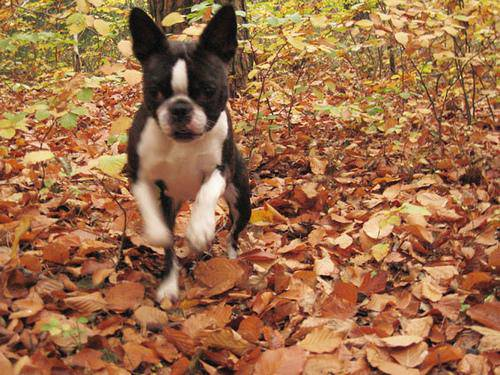

In [5]:
# Viewing an Image

from IPython.display import Image
Image("/content/drive/MyDrive/DL/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [6]:
filenames = ["/content/drive/MyDrive/DL/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames

['/content/drive/MyDrive/DL/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DL/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DL/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DL/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DL/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DL/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DL/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DL/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DL/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DL/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/DL/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/DL/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/DL/train/00693b8bc2470375cc744a6391d397ec.jpg',
 '/content/drive/MyDrive/DL/train/006cc3ddb9dc1bd82

In [7]:
import os
print(len(filenames))
print(len(os.listdir("/content/drive/MyDrive/DL/train/")))

10222
10222


In [8]:
# Check whether number of filenames matches number of actual image files

import os
if len(os.listdir("/content/drive/MyDrive/DL/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


In [9]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
labels[:10]

# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


In [10]:
labels = labels_csv["breed"]
labels=labels.values
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
unique_breed=np.unique(labels)
print(len(unique_breed))

120


In [13]:
# perform one hot encoding on this

bool_label = [label==unique_breed for label in labels]
bool_label

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [14]:
len(bool_label)

10222

In [15]:
# now we have to convert this boolean array into integers

print(bool_label[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Create a Validation Set

In [16]:
X = filenames
Y = bool_label

We will start off by experimenting for only a smaller subset of images and then increase the size as yet we are not sure which model would be perfect for us , so thats the reason and DL models take a long time to run hence we would run on a subset of images

In [17]:
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000 , step:1000}

In [18]:
from sklearn.model_selection import train_test_split
X_tr,X_val,Y_tr,Y_val = train_test_split(X[:NUM_IMAGES],Y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [19]:
print(len(X_tr))
print(len(Y_tr))
print(len(X_val))
print(len(Y_val))



800
800
200
200


## Preprocessing Images (turn images into tensors)

* We will write a function to do turn images into tensors

* A Tensor is a way to represent information in numbers. If you're familar with NumPy arrays (you should be), a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

### Steps to follow

1. Input will be a filename of image
2. Uses TensorFlow to read the file and save it to a variable `image`.
4. Normalize the images color channels.
5. Turn our `image` into tensors.
6. Resize the `image` to shape of (224,224)
7. Return the modified image

In [20]:
from matplotlib.pyplot import imread
image = imread(filenames[42]) # read in an image
image.shape

(257, 350, 3)

In [21]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [22]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image


## Turn data into batches



In [23]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [24]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [25]:
train_data = create_data_batches(X_tr,Y_tr)
validation_data = create_data_batches(X_val,Y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [26]:
train_data.element_spec, validation_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing our batch data

In [27]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breed[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [28]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [29]:
# This is for unbatching the data by using next(as_numpy_iterator)
train_images,train_labels = next(train_data.as_numpy_iterator())

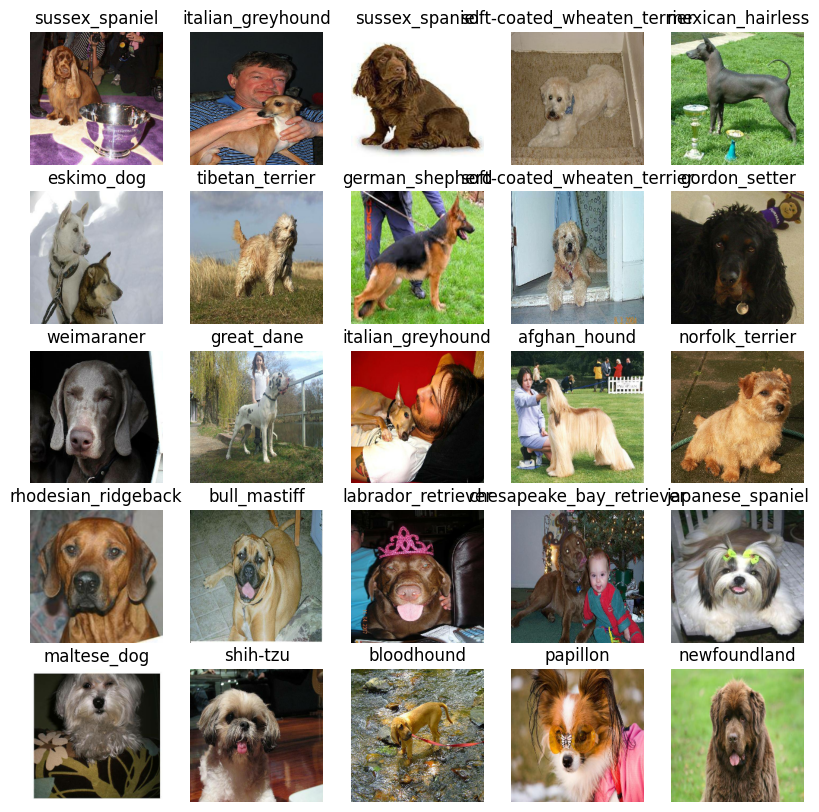

In [30]:
show_images(train_images,train_labels)

In [31]:
validation_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [32]:
val_image,val_labels = next(validation_data.as_numpy_iterator())

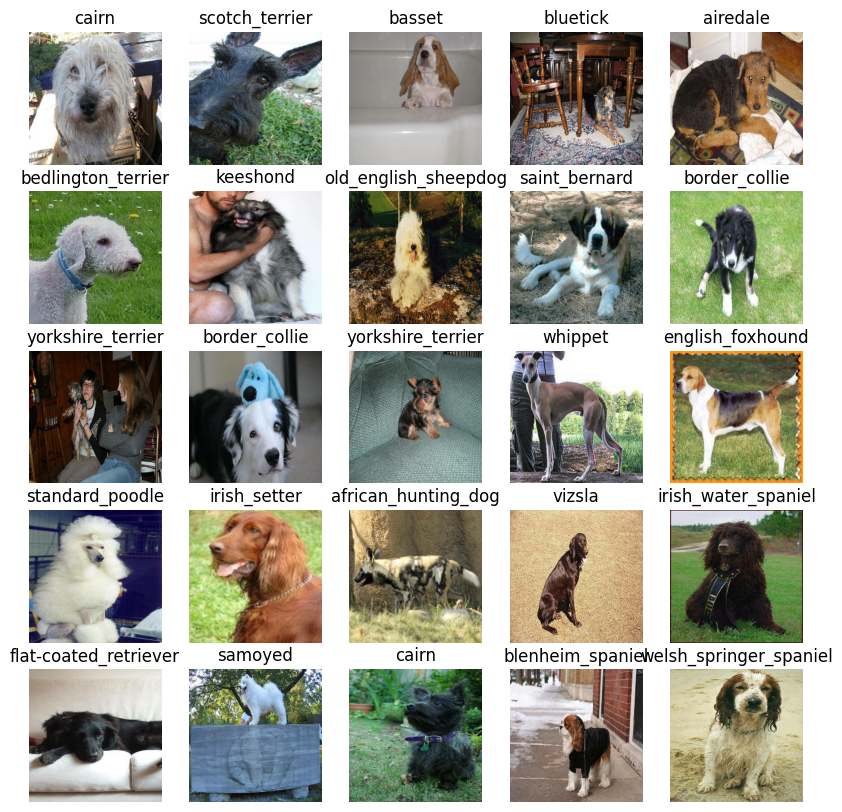

In [33]:
show_images(val_image,val_labels)

# Create and Training Model

1. Define Input shape
2. Define Output shape
3. Define URL form TensorFlow Hub

In [34]:
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]  # batch size , im

OUTPUT_SHAPE = len(unique_breed)  # 120 as utna hee predict karna h max

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [35]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [36]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Callbacks


Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks :

1. One for TensorBoard which helps to track our models progress
2. For early training and stop if model is beginning to overfit


### TensorBoard Callback

To set this up :

1. Load TensorBoard extension
2. Create a TensorBoard callback which is able to save logs(basically how our model is training) to a directory and pass it to our model's `fit()` function .
3. Visualize our models training logs

In [37]:
# Load TensorBoard into your notebook extension

%load_ext tensorboard
import datetime

In [38]:
def create_tensorboard_callback():
  # Create a logs directory in DL folder which will store our progress
  logdir = os.path.join("/content/drive/MyDrive/DL/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.



In [39]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy" , patience=3)

## Training Our Model

1. Note that our first model is going to train on 1000 images only X, Y is of size=1000
2. Create a model using `create_model()`
3. Setup a tensorboard callback using `create_tensorboard_callback()`
4. Call fit `fit()` function on our model by passing the trining data , validation_data , epochs and the callbacks.
5. Return the model

In [40]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [41]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=validation_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [42]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 249s 10s/step - loss: 4.7265 - accuracy: 0.0862 - val_loss: 3.3900 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 163ms/step - loss: 1.6990 - accuracy: 0.6687 - val_loss: 2.1779 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 4s 165ms/step - loss: 0.5884 - accuracy: 0.9388 - val_loss: 1.6770 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 163ms/step - loss: 0.2542 - accuracy: 0.9862 - val_loss: 1.5179 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 4s 164ms/step - loss: 0.1483 - accuracy: 0.9975 - val_loss: 1.4443 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 169ms/step - loss: 0.1011 - accuracy: 1.0000 - val_loss: 1.3990 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================

## Checking the TensorBoard logs

In [43]:
%tensorboard --logdir /content/drive/MyDrive/DL/logs

<IPython.core.display.Javascript object>

## Making Predictions on our Validation Data

In [44]:
predictions = model.predict(validation_data, verbose=1)
predictions

7/7 [==============================] - 10s 108ms/step


array([[2.2248277e-03, 1.3183709e-04, 6.4858684e-04, ..., 6.0424565e-05,
        1.5102194e-05, 1.4060372e-02],
       [1.2277471e-03, 5.6099962e-03, 2.2034468e-02, ..., 7.2110887e-04,
        1.1041887e-03, 5.1055703e-04],
       [5.2681705e-04, 3.5005092e-04, 2.3314726e-04, ..., 2.3042804e-04,
        1.8906643e-04, 4.1582719e-03],
       ...,
       [1.0770092e-05, 1.7479349e-05, 6.1770894e-05, ..., 1.3258182e-05,
        8.7082182e-05, 2.9186685e-05],
       [4.3388577e-03, 3.9601355e-04, 7.0349583e-05, ..., 3.6625226e-04,
        2.2224379e-04, 8.4760506e-03],
       [3.3192124e-04, 1.2055017e-05, 3.2074275e-04, ..., 6.2892148e-03,
        1.8260867e-03, 5.3120567e-04]], dtype=float32)

In [45]:
len(predictions[0])

120

In [46]:
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breed[np.argmax(predictions[index])]}")

[2.22482765e-03 1.31837092e-04 6.48586836e-04 7.42312928e-04
 2.45075644e-04 1.41042125e-04 1.14787631e-01 2.52252939e-04
 6.51673181e-05 1.66529813e-03 1.63724355e-03 9.21033279e-05
 1.46346109e-04 1.04251361e-04 2.40215403e-03 4.65270161e-04
 2.16204990e-05 3.42435092e-01 3.00989323e-05 2.81044398e-04
 1.00750942e-03 4.34810470e-04 1.17298950e-04 5.85066294e-03
 1.35737617e-04 6.87397260e-04 6.76797777e-02 6.17718324e-04
 2.07820704e-04 1.40823657e-04 9.34372947e-05 1.68154109e-03
 1.26288168e-03 3.77400247e-05 2.24431369e-05 2.49283351e-02
 2.27387663e-05 2.38636945e-04 5.15886059e-04 7.31023261e-04
 2.40895711e-03 2.24940391e-04 1.27810155e-04 8.52665107e-05
 7.79099501e-05 3.67738685e-04 2.68288539e-04 6.00561441e-04
 1.44600024e-04 4.17748757e-04 1.42271549e-03 1.73124150e-04
 1.13594549e-04 2.91618089e-05 2.03981937e-04 7.34547139e-05
 2.55204388e-04 1.37600384e-03 3.89195018e-04 1.04972519e-01
 1.58319221e-04 2.28332046e-05 2.16331310e-03 3.58658435e-05
 8.45033792e-04 2.126576

In [47]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breed[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'brittany_spaniel'

Now we need to unbatch the data so that we have it in form of a proper text as we should compare it with our predictions

In [48]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(validation_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [49]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

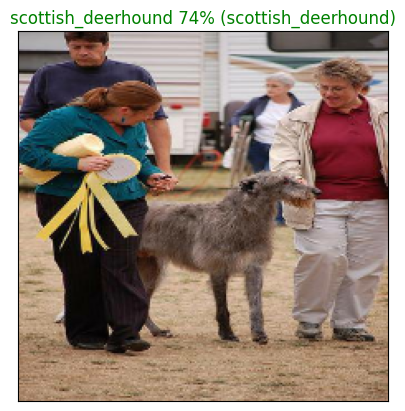

In [50]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n=124)

### Let us make a function to view our model's top predictions

In [51]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breed[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

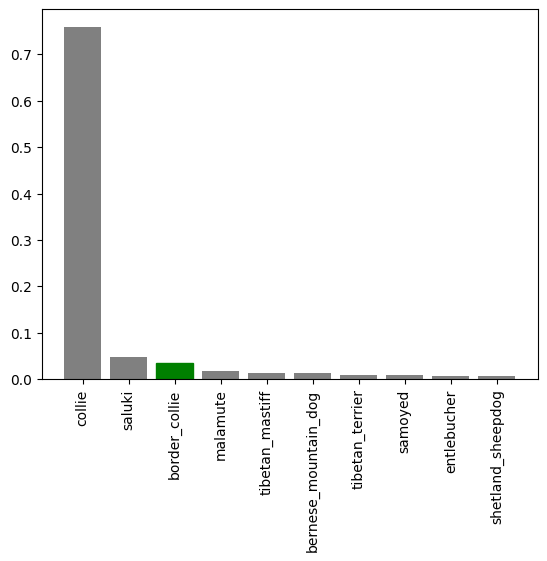

In [52]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

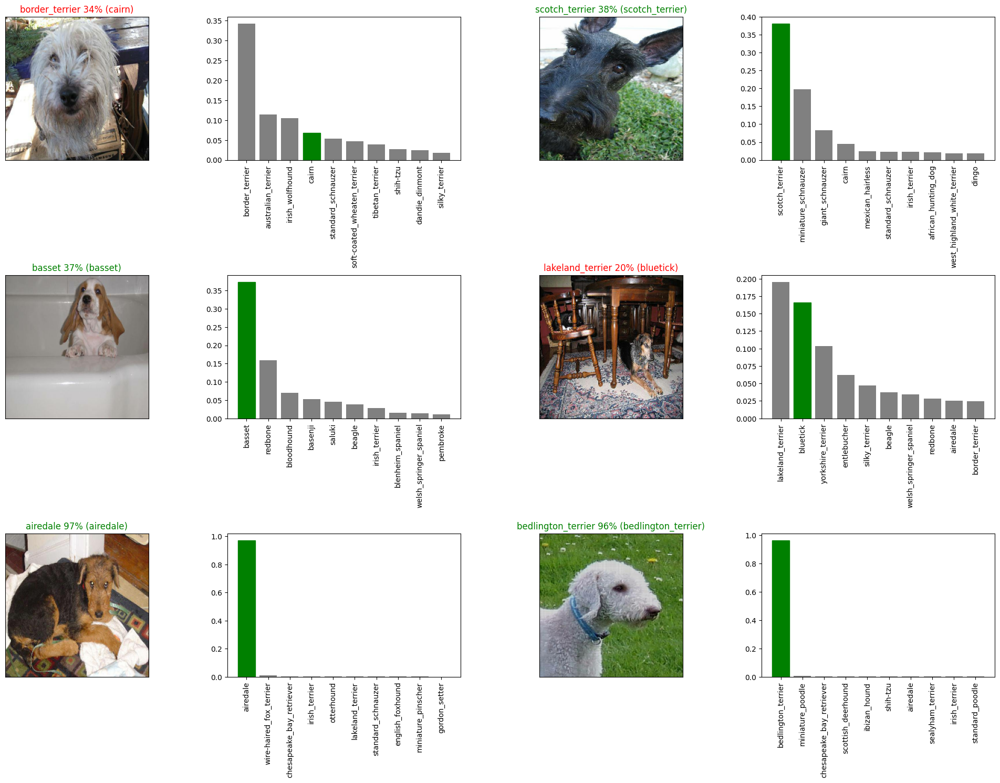

In [53]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Loading our Trained model

* Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

* The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory.

In [54]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/DL/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [55]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})  #we used tf Hub , so custom_object dictionary is passed
  return model

In [56]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/DL/models/20240611-05461718084772-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/DL/models/20240611-05461718084772-1000-images-Adam.h5'

In [57]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/My Drive/DL/models/20240611-05461718084772-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/DL/models/20240611-05461718084772-1000-images-Adam.h5


In [58]:
model.evaluate(validation_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.3479 - accuracy: 0.6450


[1.3479379415512085, 0.6449999809265137]

In [59]:
model_1000_images.evaluate(validation_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.3479 - accuracy: 0.6450


[1.3479379415512085, 0.6449999809265137]

## Train on Full Dataset

In [60]:
len(Y)

10222

In [61]:
full_data = create_data_batches(X,Y)
# data batch is ready for the full dataset

Creating training data batches...


In [62]:
# Now create model for the full dataset

full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [63]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**NOTE:** This below cell could take a lot of time to run as it is training on 10000+ images , so first epoch will take a lot of time to run on GPU too.

In [65]:
# # Fit the full model to the full training data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2516s 8s/step - loss: 1.3394 - accuracy: 0.6699
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.4021 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 41s 129ms/step - loss: 0.2388 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1561 - accuracy: 0.9604
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1053 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0751 - accuracy: 0.9886
Epoch 7/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0588 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0461 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0386 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 43s 134ms

##  Saving our Fully Trained Model

Now , we will save and load our trained model as it took a lot of time to train , it is always better to save our model

In [66]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/My Drive/DL/models/20240611-06481718088521-all-images-Adam.h5...


'drive/My Drive/DL/models/20240611-06481718088521-all-images-Adam.h5'

In [67]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/DL/models/20240611-06481718088521-all-images-Adam.h5')

Loading saved model from: drive/My Drive/DL/models/20240611-06481718088521-all-images-Adam.h5


## Making Predictions on the Test Dataset

* Note that our test dataset should be of the form of tensors in order to evaluate it , so we will use all our functions we had made to do so .
* We have test data in form of filenames
* So , filenames -> tensor_batch ->

In [69]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/MyDrive/DL/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/DL/test/e4235f4b313a4b49946938992dd95249.jpg',
 'drive/MyDrive/DL/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/DL/test/e4b76574d24800b91bdcfc886fb74f23.jpg',
 'drive/MyDrive/DL/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 'drive/MyDrive/DL/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 'drive/MyDrive/DL/test/e5b43e17eb88bc5e2d6e9d1d04c01a5a.jpg',
 'drive/MyDrive/DL/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 'drive/MyDrive/DL/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 'drive/MyDrive/DL/test/e39be68f3200f0ecde589e571ae6df06.jpg',
 'drive/MyDrive/DL/test/def639bab46dfc714234180be730ef49.jpg']

Now we have got the filenames to our test data

In [70]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


**NOTE:** The below cell is also going to take a long time to run , almost more than an hour

In [71]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 353s 1s/step


In [72]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/DL/preds_array.csv", test_predictions , delimiter=",")

In [73]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/DL/preds_array.csv", delimiter=",")

In [74]:
test_predictions[:10]


array([[3.19010790e-12, 3.31143316e-13, 5.01532708e-16, ...,
        1.49156895e-14, 5.81488191e-10, 5.60053601e-11],
       [2.25048133e-10, 4.69566066e-06, 1.52729029e-09, ...,
        3.11818105e-09, 3.55276342e-09, 9.32654509e-10],
       [1.34629454e-05, 9.74500927e-06, 2.37536397e-11, ...,
        1.32048684e-14, 5.76273377e-14, 9.58402593e-11],
       ...,
       [1.94607885e-09, 4.63384254e-07, 8.48086379e-10, ...,
        1.33149001e-06, 1.33850444e-05, 3.60633878e-09],
       [1.18065941e-06, 4.40220704e-09, 2.46231355e-08, ...,
        2.13825679e-10, 1.71556312e-05, 1.12134370e-03],
       [4.74041251e-09, 5.95211241e-11, 1.07676238e-11, ...,
        1.81105442e-08, 8.22180258e-12, 4.16245278e-08]])

In [75]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

In [76]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breed))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [77]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/DL/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4235f4b313a4b49946938992dd95249,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e193c532dc7c9a5ee397848a1ee007f0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e4b76574d24800b91bdcfc886fb74f23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e218c0da622fedc975a97999ad7d48a5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2f94ad185a2cfa2311c66c3e8bdba17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breed)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4235f4b313a4b49946938992dd95249,3.190108e-12,3.311433e-13,5.015327e-16,1.623829e-15,2.331377e-14,2.622224e-13,1.052341e-16,5.006234e-14,3.702844e-15,...,3.524048e-13,8.667420e-14,1.079371e-13,9.007685e-15,1.252384e-14,5.047709e-15,8.359175e-15,1.491569e-14,5.814882e-10,5.600536e-11
1,e193c532dc7c9a5ee397848a1ee007f0,2.250481e-10,4.695661e-06,1.527290e-09,3.003193e-07,5.928997e-08,1.812921e-08,7.147651e-10,5.856494e-11,6.372182e-07,...,4.777457e-09,9.087449e-10,1.685684e-10,2.200213e-07,4.194776e-10,5.736078e-03,6.018679e-08,3.118181e-09,3.552763e-09,9.326545e-10
2,e4b76574d24800b91bdcfc886fb74f23,1.346295e-05,9.745009e-06,2.375364e-11,4.679614e-10,2.554350e-11,3.257250e-06,1.499708e-10,2.460040e-10,1.611796e-10,...,6.633622e-06,6.751290e-10,4.330738e-12,2.202983e-11,8.246655e-12,9.846253e-14,3.975039e-13,1.320487e-14,5.762734e-14,9.584026e-11
3,e218c0da622fedc975a97999ad7d48a5,4.715914e-09,4.435089e-12,1.451698e-12,7.040298e-16,7.566728e-10,8.874382e-15,4.690315e-08,8.642184e-10,1.143255e-11,...,1.756252e-04,1.917046e-08,1.413060e-09,1.673507e-11,1.877030e-11,3.907001e-12,5.784731e-07,1.651175e-13,7.807826e-11,1.499181e-05
4,e2f94ad185a2cfa2311c66c3e8bdba17,3.602290e-06,1.241737e-08,1.331809e-10,9.234850e-12,1.431624e-10,3.501660e-11,4.118637e-11,1.299768e-09,1.797671e-09,...,1.850890e-10,7.343536e-08,2.503992e-09,5.424014e-08,1.781070e-10,2.965688e-11,6.142823e-09,2.032275e-12,1.828857e-06,1.488234e-07


In [80]:
preds_df.to_csv("drive/MyDrive/DL/submission_mobilenet_V2.csv",index=False)
# Submission file format hai yeh